# Cyklodoprava
Zdroj dat: https://api.golemio.cz/v2/bicyclecounters/detections

In [1]:
import folium
import csv
import pandas as pd
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt

### Průzkum dat

In [2]:
df = pd.read_csv('counts.csv')
display(df.head())
display(df.info())

,date,camea-BC_AL-ST,camea-BC_AL-PL,camea-BC_AT-LA,camea-BC_AT-ST,camea-BC_BS-ZL,camea-BC_BS-BM,camea-BC_CB-CH,camea-LO_CB-TU,camea-BC_CL-PV,...,camea-BC_VK-HR,camea-BC_VK-MO,camea-BC_VK-KO,camea-VR-VY,camea-VR-ST,camea-BC_VS-CE,camea-BC_ZA-BO,camea-BC_ZA-KL,ecoCounter-103047647,ecoCounter-104047647
0,2020-01-01,0.0,36.0,0.0,6.0,184.0,131.0,45.0,51.0,186.0,...,65.0,193.0,239.0,9.0,19.0,0.0,159.0,199.0,NaN,NaN
1,2020-01-02,8.0,88.0,0.0,94.0,0.0,0.0,45.0,30.0,116.0,...,71.0,39.0,63.0,104.0,114.0,0.0,27.0,51.0,NaN,NaN
2,2020-01-03,8.0,97.0,0.0,69.0,83.0,50.0,37.0,32.0,106.0,...,84.0,47.0,74.0,108.0,119.0,0.0,24.0,53.0,NaN,NaN
3,2020-01-04,1.0,50.0,0.0,6.0,101.0,48.0,37.0,33.0,110.0,...,69.0,89.0,78.0,60.0,82.0,0.0,64.0,82.0,NaN,NaN
4,2020-01-05,0.0,59.0,0.0,18.0,152.0,123.0,58.0,39.0,181.0,...,93.0,195.0,191.0,69.0,76.0,0.0,139.0,205.0,NaN,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2032 entries, 0 to 2031
Data columns (total 79 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   date                  2032 non-null   object 
 1   camea-BC_AL-ST        2028 non-null   float64
 2   camea-BC_AL-PL        2028 non-null   float64
 3   camea-BC_AT-LA        2028 non-null   float64
 4   camea-BC_AT-ST        2028 non-null   float64
 5   camea-BC_BS-ZL        2028 non-null   float64
 6   camea-BC_BS-BM        2028 non-null   float64
 7   camea-BC_CB-CH        2028 non-null   float64
 8   camea-LO_CB-TU        2028 non-null   float64
 9   camea-BC_CL-PV        2028 non-null   float64
 10  camea-BC_CL-LI        2028 non-null   float64
 11  camea-BC_CT-OT        0 non-null      float64
 12  camea-BC_CT-PB        0 non-null      float64
 13  camea-LO_DE-SA        0 non-null      float64
 14  camea-LO_DE-EV        0 non-null      float64
 15  camea-BC_DS-KJ       

None

In [3]:
df.date = pd.to_datetime(df.date)

In [4]:
profile = ProfileReport(df, 
                        title="Profiling Report", 
                        correlations={
                            "pearson": {"calculate": False},
                            "spearman": {"calculate": False},
                            "kendall": {"calculate": False},
                            "phi_k": {"calculate": False},
                            "auto": {"calculate": False},
                        },
                        interactions={
                            "continuous": False,
                            "targets": []
                        })
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 79/79 [00:00<00:00, 467.82it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Čištění dat
(korelace je v pořádku)

In [5]:
# Odstranění prázdných sloupců
empty = [col for col in df.columns if df[col].isnull().all()]
df.drop(empty, axis=1, inplace=True)

# Odranění sloupců s nulovou variabilitou
df = df.loc[:, df.nunique() > 1]

Sloupce s více než 10 % nul: ['camea-BC_AL-PL', 'camea-BC_BS-ZL', 'camea-BC_BS-BM', 'camea-BC_CB-CH', 'camea-LO_CB-TU', 'camea-BC_DS-KJ', 'camea-BC_DS-VL', 'camea-BC_EU-KT', 'camea-BC_EU-OT', 'camea-BC_HY-WI', 'camea-BC_KR-RA', 'camea-BC_KR-ZB', 'camea-ST-RA', 'camea-ST-BA', 'camea-BC_VK-MO', 'camea-BC_VK-KO', 'camea-VR-VY', 'camea-VR-ST']


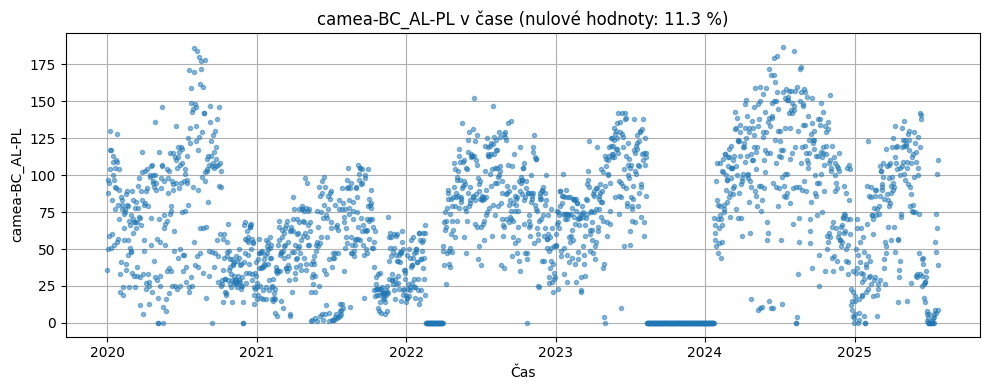

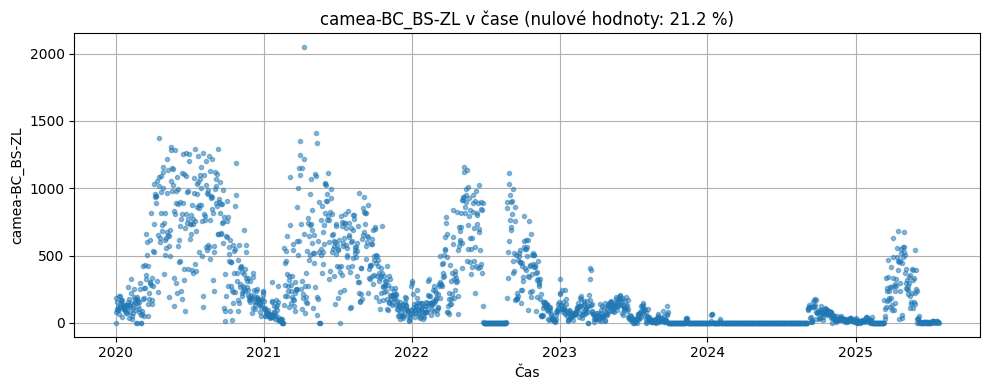

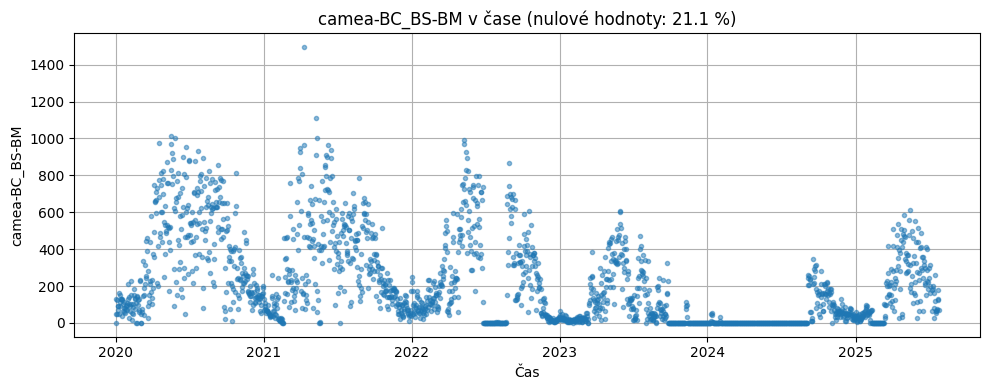

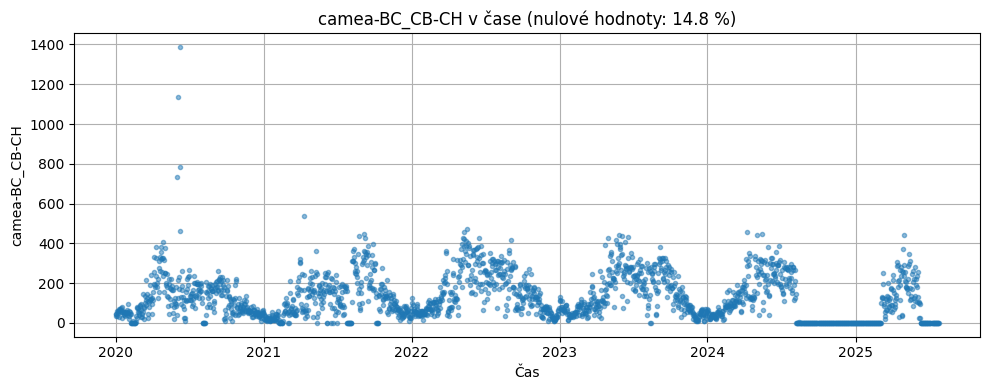

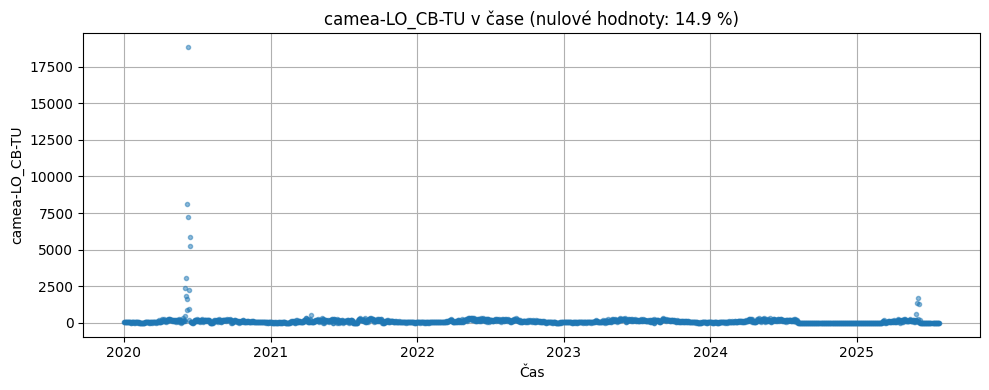

...

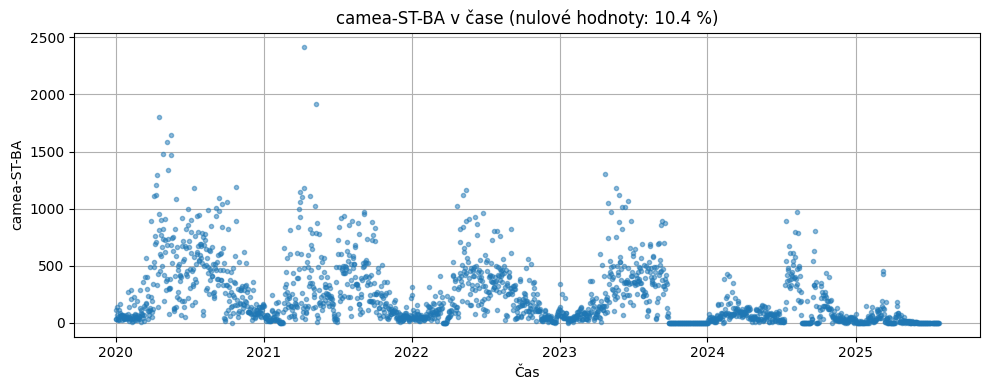

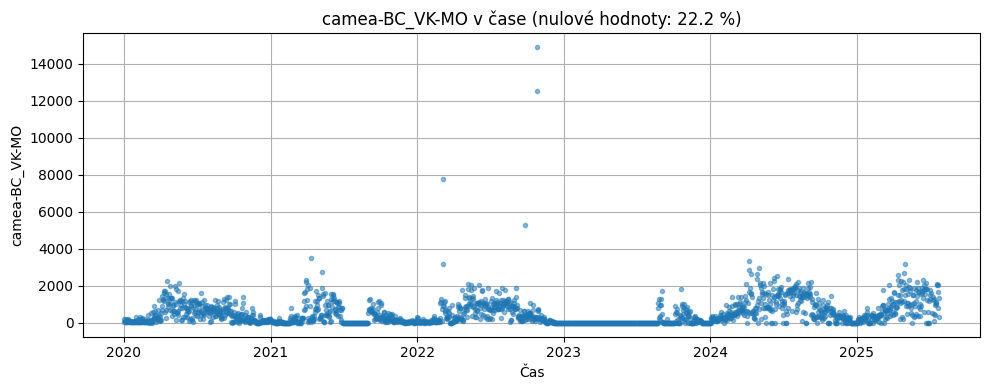

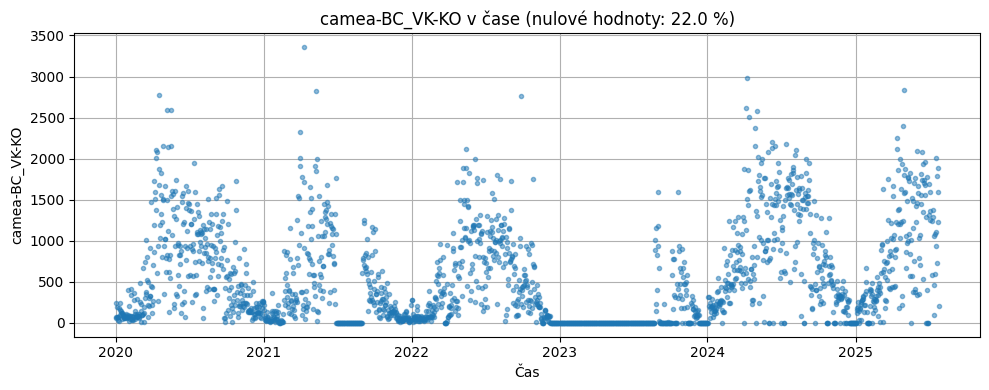

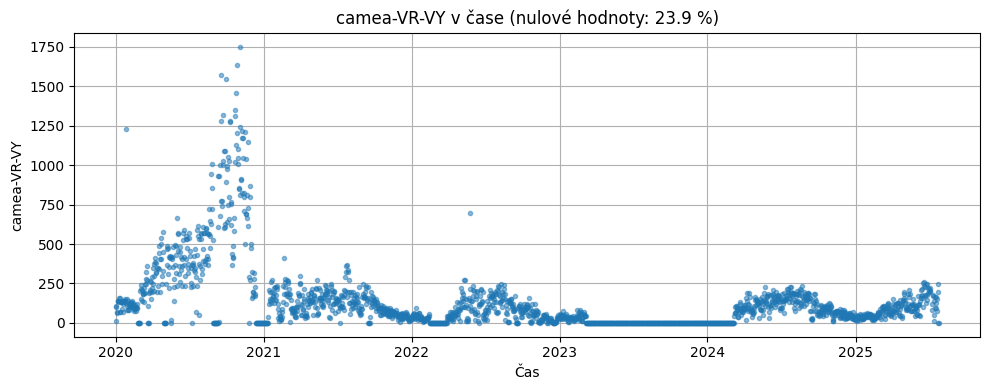

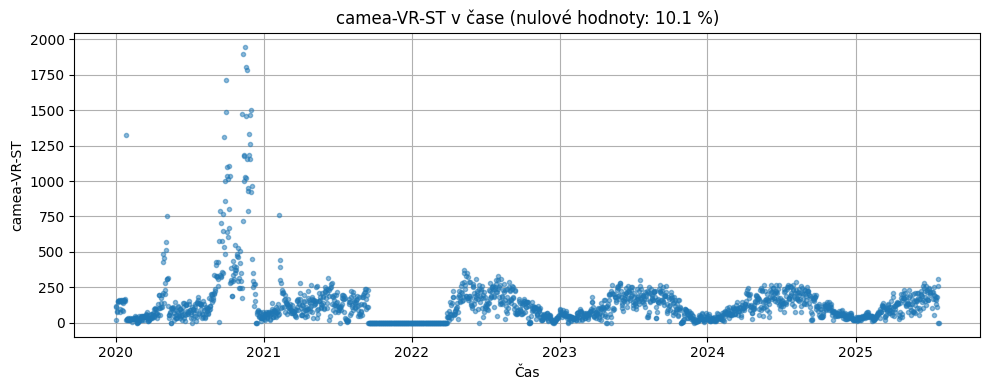

In [6]:
# vykreslení sloupců s více než 10 % nulových hodnot

%matplotlib inline
zero_ratios = (df == 0.0).sum() / len(df)
cols_with_many_zeros = zero_ratios[zero_ratios > 0.10].index

print("Sloupce s více než 10 % nul:", list(cols_with_many_zeros))

for col in cols_with_many_zeros:
    plt.figure(figsize=(10, 4))
    plt.plot(df["date"], df[col], marker=".", linestyle="none", alpha=0.5)
    plt.title(f"{col} v čase (nulové hodnoty: {zero_ratios[col]*100:.1f} %)")
    plt.xlabel("Čas")
    plt.ylabel(col)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Z grafů je vidět, že sčítače camea-LO_CB-TU a camea-BC_DS-VL mají poměrně nevyvážené hodnoty - co s tím?

Sčítače camea-BC_EU-KT a camea-BC_EU-OT mají nenulové hodnoty až od poloviny roku 2023, a proto tyto dva také odstraním.


In [7]:
df = df.drop(columns=["camea-BC_EU-KT", "camea-BC_EU-KT"])

In [8]:
df.to_csv('counts_cleaned.csv', index=False)

### Zobrazeí

In [9]:
profile = ProfileReport(df, 
                        title="Profiling Report", 
                        correlations={
                            "pearson": {"calculate": False},
                            "spearman": {"calculate": False},
                            "kendall": {"calculate": False},
                            "phi_k": {"calculate": False},
                            "auto": {"calculate": False},
                        },
                        interactions={
                            "continuous": False,
                            "targets": []
                        })
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 62/62 [00:00<00:00, 180.26it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
df_counters = pd.read_csv("counters.csv")
valid_ids = df.columns.tolist()
valid_ids.remove("date")
filtered = df_counters[df_counters["direction_id"].isin(valid_ids)]
filtered.to_csv("counters_cleaned.csv", index=False, encoding="utf-8")

In [11]:
map = folium.Map(location=[50.08, 14.42], zoom_start=12)

with open('counters_cleaned.csv', 'r', encoding='utf-8') as f:
    reader = csv.DictReader(f)
    for row in reader:
        lat = float(row['latitude']) if row['latitude'] else None
        lon = float(row['longitude']) if row['longitude'] else None
        if lat and lon:
            popup = f"<b>{row['name']}</b><br>Trasa {row['route']}"
            folium.Marker(location=[lat, lon], popup=popup).add_to(map)

map.save('counters_map.html')